<a href="https://colab.research.google.com/github/RLopez112/CoderEntregaDS/blob/main/EntregaFinal__Alonso%2C_Braian_Lopez%2C_Rodrigo_Sanchez%2C_Axel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

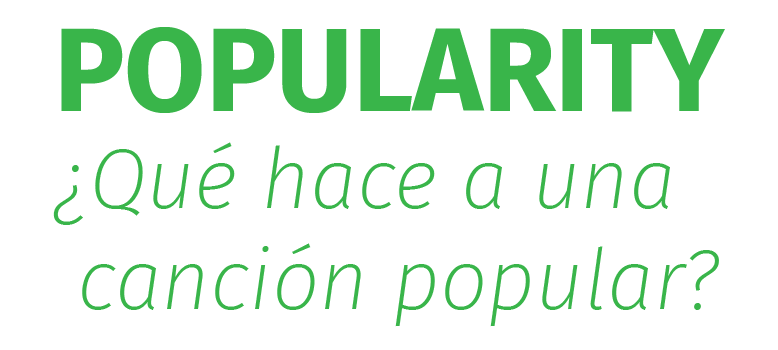

<font color='limegreen' size=5>Entrega final Coderhouse Data Science </font> <br>
<font color='limegreen'>Comisión 32765 / Alonso, Braian - Lopez, Rodrigo - Sanchez, Axel</font>

<style>
.spelling-error {
  text-decoration-line: underline;
  text-decoration-style: wavy;
  text-decoration-color: red;
}
</style>

# <font color='limegreen'>**ÍNDICE**</font>
[<font color='limegreen'> <u> 1. IMPORTACIONES ](#scrollTo=kNUr8d-23xrf)  
[<font color='limegreen'> <u> 2. CONTEXTO COMERCIAL ](#scrollTo=D5p7SkqT4DzO)  
[<font color='limegreen'> <u> 3. ANÁLISIS EXPLORATORIO ](#scrollTo=R7KU704L4SuX)  
[<font color='limegreen'> <u> 4. ANÁLISIS EXPLORATORIO DE POPULARIDAD ](#scrollTo=16eS311I4iAb)  
[<font color='limegreen'> <u> 5. RECOMENDACIONES INICIALES ](#scrollTo=HVOKaJOd8cio)  
[<font color='limegreen'> <u> 6. DATA WRANGLING ](#scrollTo=-krFdOvg6uTx)  
[<font color='limegreen'> <u> 7. PIPE ](#scrollTo=hoq-Bb0L4X6X)   
[<font color='limegreen'> <u> 8. ENTRENAMIENTO ](#scrollTo=kE_dUT3p4adr)  
[<font color='limegreen'> <u> 9. CROSS VALIDATION ](#scrollTo=81DQMvYgEAtN)  
[<font color='limegreen'> <u> 10. TUNNING ](#scrollTo=kp09iNZ1EGh8)  
[<font color='limegreen'> <u> 11. FEATURE IMPORTANCE ](#scrollTo=JITJdbLDOyPO)  
[<font color='limegreen'> <u> 12. CONCLUSIONES](#scrollTo=4PTNiGcJEUQ1)  


# <font color='limegreen'>**IMPORTACIONES**</font>

## <font color='limegreen'>MÓDULOS</font>

In [477]:
#DRIVE IMPORT
from google.colab import drive 

#MATH FUNCTIONS
import math

# LIBRERÍAS BASE
import pandas as pd
import numpy as np

#LIBRERIAS GRÁFICAS

#PARA TEXTOS MÁS LINDOS
from IPython.display import display,HTML,IFrame

#SEABORN
import seaborn as sns
#MATPLOTLIB
import matplotlib.pyplot as plt
import matplotlib as mpl

#PLOTLY
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots
!pip install dash
from dash.html import Br, Div
from dash.dash_table import DataTable
from dash.dash_table.Format import Format, Scheme, Trim

#SCIKITLEARN

from sklearn.neighbors import KNeighborsClassifier

from sklearn.model_selection import train_test_split
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import KFold, cross_val_score
from sklearn.model_selection import cross_validate
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold

from sklearn.linear_model import LogisticRegression

from sklearn import metrics 
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import roc_curve, roc_auc_score, auc
from sklearn.metrics import recall_score
from sklearn.metrics import make_scorer
from sklearn.metrics import classification_report

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import Normalizer

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer 

from sklearn import tree 
from sklearn.tree import DecisionTreeClassifier 

from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.linear_model import LinearRegression as LR

#IMBLEARN
from imblearn.over_sampling import SMOTE

#XGBOOST
!pip install xgboost
import xgboost as xgb




import warnings
warnings.filterwarnings("ignore")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## <font color='limegreen'>DATASET</font>

In [478]:
drive.mount('/content/gdrive') 

spotify= pd.read_csv('/content/gdrive/MyDrive/coderhouse/dataset_spotify.csv',sep=',')
spotify=spotify.drop(['Unnamed: 0'],axis='columns')
# Maharshi Pandya. (2022). <i>🎹 Spotify Tracks Dataset</i> [Data set]. Kaggle. https://doi.org/10.34740/KAGGLE/DSV/4372070
# Fecha dataset. 22 Octubre 2022 

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


El dataset tiene fecha de creado en Octubre 2022 <br>
No tiene información sobre donde se creo. Lo que podría generar un sesgo dependiente del idioma

##<font color='limegreen'>SETEO DEFAULTS DE GRÁFICA</font>

In [479]:
#HTML pretty text
def printPrettyText(text,size,color):
  start=f'<h1 style="color:{color};font-size:{size}px;">{text} </h1>'
  return HTML(start)

def printMetadata(canciones,minutos,generos,artistas,variables,sizeTitle,sizeValue):
  return HTML(
      f'''
      <div style="width: 1300px; display: flex; flex-wrap: wrap; font-weight: 700;justify-content:space-between">
      <div>
        <div style="width:auto; height:auto; font-size: {sizeValue}px; color: black">{canciones}</div>
        <div style="width:auto; height:auto;font-size: {sizeTitle}px; color: limegreen">CANCIONES</div>
      </div>
      <div>
        <div style="width:auto; height:auto; font-size: {sizeValue}px; color: black">{minutos}</div>
        <div style="width:auto; height:auto;font-size: {sizeTitle}px; color: limegreen">MINUTOS DE MÚSICA</div>
      </div>
      <div>
        <div style="width:auto; height:auto; font-size: {sizeValue}px; color: black">{generos}</div>
        <div style="width:auto; height:auto;font-size: {sizeTitle}px; color: limegreen">GÉNEROS</div>
      </div>
      <div>
        <div style="width:auto; height:auto; font-size: {sizeValue}px; color: black">{artistas}</div>
        <div style="width:auto; height:auto;font-size: {sizeTitle}px; color: limegreen">ARTISTAS</div>
      </div>
      <div>
        <div style="width:auto; height:auto; font-size: {sizeValue}px; color: black">{variables}</div>
        <div style="width:auto; height:auto;font-size: {sizeTitle}px; color: limegreen">VARIABLES</div>
      </div>
    </div>
    '''
  )


In [480]:
 


defaultXaxesStyle=dict(
    title=dict(font=dict(size=20)),
    showgrid=False,
    gridwidth=1, 
    gridcolor='gray',
    showline=False, 
    linewidth=2, 
    linecolor=greenColor,
    zeroline = False
    )
defaultYaxesStyle=dict(
    title=dict(font=dict(size=20)),
    showgrid=True,
    gridwidth=1, 
    gridcolor='rgba(80,80,80,.1)',
    showline=False, 
    linewidth=2, 
    linecolor=greenColor,
    zeroline = False)

defaultLayoutStyle=dict(
    width=1300, 
    title_x=0.5,
    title=dict(font=dict(size=30)),
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    font_family="Roboto Black",
    font_color=greenColor,
    #title_font_family="Roboto Bold",
    title_font_color=greenColor,
    legend_title_font_color=greenColor,
    
    
)


continuousColorScale=[[0, grayColor], [1, greenColor]]
discreteColorSequence=[grayColor, greenColor]


#<font color='limegreen'>**CONTEXTO COMERCIAL**</font>

Estamos trabajando para un productor musical latino que está buscando su nuevo hit. Como el mercado es extremadamente competitivo necesita una guía sobre que tipo de canción será mejor recibida.
Para así reducir el riesgo de la inversión.

La producción musical es una industria impulsada por la creatividad, pero con los avances en la tecnología, ahora hay una oportunidad de incorporar ideas basadas en datos en el proceso creativo. Al aprovechar los algoritmos de aprendizaje automático, podemos analizar grandes conjuntos de datos de pistas de música populares y extraer características clave que son comunes entre las pistas exitosas. Estas características podrían incluir cosas como el tempo, las progresiones de acordes, las letras e incluso el estado de ánimo de la pista.

Al combinar la creatividad del productor con el poder analítico del aprendizaje automático, podemos llegar a un mejor resultado.


Actualmente existen varias plataformas donde podemos monetizar canciones. 

**Los más populares**
*   Spotify
*   Apple Music
*   Qobuz
*   Tidal
*   Amazon Music

Dentro de esta selección entendemos que la mejor fuente de información es Spotify. Porque nos parece que es la más popular

El dataset que utilizaremos tiene 20 columnas y 114.000 filas.
Cada fila corresponde a una canción

Y las variables que tenemos de cada canción son:

**Variables:**

*   track_id: El ID de la canción en Spotify.

*   artist: Los nombres de los artistas que han interpretado la canción. Si hay más de un artista, se separan con un ;.

*   album_name: El nombre del álbum en el que aparece la canción.

*   track_name: El nombre de la canción.

*   popularity : La popularidad de una pista es un valor entre 0 y 100, siendo 100 la más popular. La popularidad se calcula mediante un algoritmo y se basa, principalmente, en el número total de reproducciones que ha tenido la canción y en lo reciente que son esas reproducciones. Por lo general, las canciones que se reproducen mucho ahora tienen una mayor popularidad que las que se reprodujeron mucho en el pasado. Las canciones duplicadas (por ejemplo, la misma canción de un single y de un álbum) se califican de forma independiente. La popularidad del artista y del álbum se deriva matemáticamente de la popularidad de la canción.

*   duration_ms: La duración de la canción en milisegundos.

*   explícit: Si la pista tiene o no una letra explícita (verdadero = sí la tiene; falso = no la tiene O desconocido).

*   danceability: La Danceability describe lo adecuada que es una pista para bailar basándose en una combinación de elementos musicales que incluyen el tempo, la estabilidad del ritmo, la fuerza del compás y la regularidad general. Un valor de 0,0 es el menos bailable y 1,0 es el más bailable.

*   Energy (energía): La energía es una medida de 0,0 a 1,0 y representa una medida perceptiva de intensidad y actividad. Por lo general, las pistas energéticas son rápidas, ruidosas y con mucho ruido. Por ejemplo, el death metal tiene mucha energía, mientras que un preludio de Bach tiene una puntuación baja en la escala

*   key (clave): El tono en el que se encuentra la pista. Los números enteros se asignan a los tonos utilizando la notación estándar de la clase de tono. Por ejemplo, 0 = C, 1 = C♯/D♭, 2 = D, y así sucesivamente. Si no se detecta ninguna tonalidad, el valor es -1.

*   loudness (sonoridad): La sonoridad general de una pista en decibelios (dB).

*   Mode (modo): El modo indica la modalidad (mayor o menor) de una pista, el tipo de escala del que se deriva su contenido melódico. La mayor se representa con 1 y la menor con 0.

*   Speechiness(locuacidad): La locuacidad detecta la presencia de palabras habladas en una pista. Cuanto más exclusivamente hablada sea la grabación (por ejemplo, un programa de entrevistas, un audiolibro o una poesía), más se acercará a 1,0 el valor del atributo. Los valores superiores a 0,66 describen pistas que probablemente estén compuestas exclusivamente por palabras habladas. Los valores entre 0,33 y 0,66 describen pistas que pueden contener tanto música como voz, ya sea en secciones o en capas, incluyendo casos como la música rap. Los valores por debajo de 0,33 representan probablemente música y otras pistas no habladas.

*   acousticness(acústica): Una medida de confianza de 0,0 a 1,0 sobre si la pista es acústica. 1,0 representa una confianza alta en que la pista es acústica.

*   instrumental (instrumentalidad): Predice si una pista no contiene voces. Los sonidos "Ooh" y "aah" se consideran instrumentales en este contexto. Las pistas de rap o de palabras habladas son claramente "vocales". Cuanto más se acerque el valor de instrumentalización a 1,0, mayor será la probabilidad de que la pista no tenga contenido vocal.

*   liveness(intensidad): Detecta la presencia de público en la grabación. Los valores más altos de liveness representan una mayor probabilidad de que la pista se haya interpretado en directo. Un valor superior a 0,8 proporciona una fuerte probabilidad de que la pista sea en directo.

*   valence (valencia): Una medida de 0,0 a 1,0 que describe la positividad musical que transmite una pista. Las pistas con alta valencia suenan más positivas (por ejemplo, felices, alegres, eufóricas), mientras que las pistas con baja valencia suenan más negativas (por ejemplo, tristes, deprimidas, enfadadas).

*   tempo: El tempo global estimado de una pista en pulsaciones por minuto (BPM). En la terminología musical, el tempo es la velocidad o el ritmo de una pieza determinada y se deriva directamente de la duración media del compás.

*   time_signature(compás): Un compás estimado. El compás es una convención de notación para especificar cuántos tiempos hay en cada compás. La signatura de tiempo va de 3 a 7, indicando signaturas de tiempo de 3/4, a 7/4.

*   Track_genre : El género al que pertenece la pista.





#<font color='limegreen'>**ANÁLISIS EXPLORATORIO**</font>

## <font color='limegreen'>RESUMEN METADATA</font>

In [481]:
spotify['duration_ms']=spotify['duration_ms']/1000/60 #PASO DURACION A MINUTOS

In [482]:
cantidadDeCanciones=len(spotify)
cantidadMinutos=math.trunc(spotify['duration_ms'].sum())
cantidadGeneros= len(spotify['track_genre'].unique())
cantidadArtistas= len(spotify['artists'].unique())
cantidadDeVariables= len(spotify.columns)

In [483]:
printMetadata(cantidadDeCanciones,cantidadMinutos,cantidadGeneros,cantidadArtistas,cantidadDeVariables,30,75)


## <font color='limegreen'>ESTUDIO DE NULOS</font>

In [484]:
spotify.isna().sum()

track_id            0
artists             1
album_name          1
track_name          1
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

Vemos que no hay valores nulos en nuestro dataset. Por lo que no nos tenemos que preocupar por ajustarlos

In [485]:

valoresSumadosPorGenero=spotify.groupby('track_genre').sum().sort_values(by=['duration_ms'],ascending=False)
fig = px.histogram(valoresSumadosPorGenero,x=valoresSumadosPorGenero.index,y=valoresSumadosPorGenero['duration_ms'],title='<b>Duración tiempo total en dataset por género</b>').update_traces(marker=dict(color=greenColor))
fig.update_layout(defaultLayoutStyle,barmode='stack')
fig.update_xaxes(defaultXaxesStyle,tickangle=-45)
fig.update_yaxes(defaultYaxesStyle)
fig.show()

In [486]:
songsByGenre=spotify.groupby('track_genre').size()
fig = px.histogram(songsByGenre,x=songsByGenre.index,y=spotify.groupby('track_genre').size().values,title='<b>Cantidad de canciones por género</b>').update_traces(marker=dict(color=greenColor))
fig.update_layout(defaultLayoutStyle,barmode='stack')
fig.update_xaxes(defaultXaxesStyle,tickangle=-45)
fig.update_yaxes(defaultYaxesStyle)
fig.show()

##<font color='limegreen'>ESTUDIO DE DUPLICADOS</font>

In [487]:
duplicateCheck=spotify.drop(['track_id'],axis='columns')
duplicateCheck.drop(columns=duplicateCheck.columns[0], axis=1, inplace=True)

In [488]:
duplicated=len(duplicateCheck[duplicateCheck.duplicated(keep=False)]==True)
trackNames=len(duplicateCheck[duplicateCheck.duplicated(keep='first')]==True)
duplicatedSongs=spotify[spotify.duplicated(subset='track_name',keep=False)==True]

In [489]:
duplicatedSongArtist = spotify[['artists','track_name']]
entradas = len(duplicatedSongArtist[duplicatedSongArtist.duplicated(keep=False)==True])
songArtist = len(duplicatedSongArtist[duplicatedSongArtist.duplicated(keep='first')==True])

In [490]:
printPrettyText(str(trackNames)+"  se replican exactamente<br>y equivalen "+str(duplicated)+" filas",30,greenColor)

In [491]:
printPrettyText(str(len(duplicatedSongs))+" que tienen el mismo nombre que otra canción",30,greenColor)

En este tipo de duplicados dejaremos solo una copia. Porque tener varios ejemplos de la misma cancion podría llevar a un overfitting del modelo.
Vemos que hay duplicados de canciones con el mismo nombre. Consideramos que son "covers" de canciones. Pero ¿que pasa cuando los duplicados son del mismo artista? 

In [492]:
printPrettyText(str(songArtist)+" que son canciones con el mismo nombre<br> y del mismo artista y equivalen a  "+str(entradas)+" filas",30,greenColor)

De estas variantes vamos a estudiar las canciones que tienen distinta popularidad según el disco. Como estamos intentando predecir la popularidad de canciones futuras. No podemos agregar una nueva canción a un disco que ya se publicó. 

#<font color='limegreen'>**ANÁLISIS EXPLORATORIO DE POPULARIDAD**</font>

In [493]:
fig = px.histogram(spotify, x=spotify['popularity'],title="<b>Valores de popularidad</b>").update_traces(marker=dict(color='limegreen'))
fig.update_layout(defaultLayoutStyle)
fig.update_xaxes(defaultXaxesStyle)
fig.update_yaxes(defaultYaxesStyle)
fig.show()

popularity : La popularidad de una pista es un valor entre 0 y 100, siendo 100 la más popular. La popularidad se calcula mediante un algoritmo y se basa, principalmente, en el número total de reproducciones que ha tenido la canción y en lo recientes que son esas reproducciones. Por lo general, las canciones que se reproducen mucho ahora tienen una mayor popularidad que las que se reprodujeron mucho en el pasado. Las canciones duplicadas (por ejemplo, la misma canción de un single y de un álbum) se califican de forma independiente. La popularidad del artista y del álbum se deriva matemáticamente de la popularidad de la canción.

Vemos que hay una gran concentración de canciones con popularidad 0. Dado que existe la posibilidad que esa gran cantidad de canciones pueda sesgar el modelo vamos a estudiarlo con un poco más de profundidad


##<font color='limegreen'>ANÁLISIS EXPLORATORIO DE POPULARIDAD 0</font>

In [494]:
nopop = spotify[spotify.popularity==0]

printPrettyText("Hay "+str(len(nopop))+" canciones que tienen popularidad 0",30,greenColor)

###<font color='limegreen'>ARTISTAS</font>

In [495]:
head50=nopop.groupby('artists').size().sort_values(ascending=False).head(50)

arfig = px.histogram(head50,x=head50.index,y=head50,title="<b>Cantidad de canciones por artista con popularidad 0</b>").update_traces(marker=dict(color='limegreen'))
arfig.update_xaxes(defaultXaxesStyle,tickangle=-45)
arfig.update_layout(defaultLayoutStyle)
arfig.update_yaxes(defaultYaxesStyle)
arfig.show()

Vemos que hay una gran concentración de canciones de artistas que podrían se considerados "populares" que tienen popularidad 0. Consideramos que esto es probable ya que no todas las canciones de un artista conocido tienen que ser populares. 



###<font color='limegreen'>GÉNERO</font>

In [496]:
head50=nopop.groupby('track_genre').size().sort_values(ascending=False).head(50)

arfig = px.histogram(head50,x=head50.index,y=head50,title="<b>Cantidad de canciones por genero con popularidad 0</b>").update_traces(marker=dict(color='limegreen'))
arfig.update_xaxes(defaultXaxesStyle,tickangle=-45)
arfig.update_layout(defaultLayoutStyle)
arfig.update_yaxes(defaultYaxesStyle)
arfig.show()

No hay genero que destaque por la cantidad de canciones con popularidad 0


##<font color='limegreen'>DISTRIBUCIÓN DE POPULARIDAD</font>

In [497]:
fig = px.histogram(spotify,x=spotify['popularity'],width=400,title='<b>Boxplot popularidad</b>', marginal="box").update_traces(marker=dict(color='limegreen'))
fig.update_layout(defaultLayoutStyle)
fig.update_xaxes(defaultXaxesStyle)
fig.update_yaxes(defaultYaxesStyle)   
fig.show()

En la gráfica de caja y bigotes vemos que la media de la mediana de popularidad está por debajo de 40. Lo que nos podría llevar a pensar que el repertorio de música no está bien aceptado. O que se está incluyendo canciones que no se escuchan.
Y vemos que la distribucion tiene asimetria hacia la izquierda. Tambien podemos notar que el punto de mayor densidad se encuentra alrededor del 0. 

In [498]:
spotifyNot0=spotify[spotify['popularity']>1]
fig = px.histogram(spotifyNot0,x=spotifyNot0['popularity'],width=400,title='<b>Boxplot canciones con popularidad mayor a 0</b>', marginal="box").update_traces(marker=dict(color='limegreen'))
fig.update_layout(defaultLayoutStyle)
fig.update_xaxes(defaultXaxesStyle)
fig.update_yaxes(defaultYaxesStyle)      
fig.show()

No tener en cuenta las canciones con popularidad 0 no hace variar en demasía la distribución de la popularidad

###<font color='limegreen'>ANÁLISIS DE POPULARIDAD POR GÉNERO</font>

Para que nuestra recomendación sea mas concreta. Podemos estudiar que géneros son los más populares. Para así generar una canción de ese género, asumiendo que va a tener una mediana de popularidad mayor al resto.
Nuestro fin con este estudio es comprobar que género tiene mayor éxito general. Por lo cual utilizaremos todo el dataset y no solo las canciones más populares.

In [499]:
spotify=spotify.sort_values(by=['popularity'],ascending=False)
spotifyMeanbyTrackGenre=spotify.groupby('track_genre').median().sort_values(by=['popularity'],ascending=False)
fig = px.histogram(spotifyMeanbyTrackGenre,x=spotifyMeanbyTrackGenre.index,y=spotifyMeanbyTrackGenre['popularity'],title='<b>Popularidad media por género</b>').update_traces(marker=dict(color=greenColor))
fig.update_layout(defaultLayoutStyle,barmode='stack')
fig.update_xaxes(defaultXaxesStyle,tickangle=-45)
fig.update_yaxes(defaultYaxesStyle)
fig.show()

Se ve que la cantidad de géneros que tienen una media de popularidad mayor a 50% es únicamente el 11% de la cantidad total de géneros. Todos los géneros tienen la misma cantidad de canciones (1000) por lo que podemos asumir que gran parte de las canciones en estos géneros son populares

In [500]:
printPrettyText("El género más popular es "+str(spotifyMeanbyTrackGenre.index[0]),50,greenColor)

Encontramos demasiado riesgoso enfocarse en el género más popular. Por lo que recomendamos que se elija un género de los 4 siguientes. Teniendo en cuenta que estos son los cuatro generos más populares siguientes a "pop".

In [501]:

printPrettyText("Los 5 generos más populares son <br>"+
                 str(spotifyMeanbyTrackGenre.index[0])+"<br>"+
                 str(spotifyMeanbyTrackGenre.index[1])+"<br>"+
                 str(spotifyMeanbyTrackGenre.index[2])+"<br>"+
                 str(spotifyMeanbyTrackGenre.index[3])+"<br>"+
                 str(spotifyMeanbyTrackGenre.index[4])+"<br>"+
                 "",50,greenColor)


##<font color='limegreen'>ANÁLISIS EXPLORATORIO DEL CUARTÍL SUPERIOR DE POPULARIDAD</font>

Nuestro cliente quiere que su canción compita en los charts. Por eso creemos acertado decir que, para poder competir en los charts debería estar el en cuartíl superior. 

Pero, ¿qué tan populares son las canciones en el cuartíl superior?

In [502]:
spotify['popularity'].describe()

count    114000.000000
mean         33.238535
std          22.305078
min           0.000000
25%          17.000000
50%          35.000000
75%          50.000000
max         100.000000
Name: popularity, dtype: float64

El cuartíl superior tiene una popularidad mínima de 50 llegando hasta 100.
Por lo que vamos a estudiar ese cuartil en más profundidad

In [503]:
# DEFINIMOS DATASET CON LAS CANCIONES QUE QUEREMOS ESTUDIAR
popularSongs=spotify[spotify['popularity']>50]


##<font color='limegreen'>POR GÉNERO</font>

¿Qúe géneros musicales tienen un valor medio igual o superior a 50? <br> Con ese dato podemos considerar que, estadisticamente, que la canción sea de un género en particular aumente las posibilidades de ser popular

In [504]:
mostPopularGenres=list(spotifyMeanbyTrackGenre[spotifyMeanbyTrackGenre['popularity']>50].index.values)

In [505]:
mostPopularGenres=spotifyMeanbyTrackGenre[spotifyMeanbyTrackGenre['popularity']>50]
printPrettyText("Hay "+str(len(mostPopularGenres))+" de los "+str(cantidadGeneros)+" generos <br> que tienen una media de populariad mayor",30,greenColor)


In [506]:
printPrettyText("Cantidad de géneros con valores de popular mayoreas a 50: <br> "+str(mostPopularGenres.index),30,greenColor)

##<font color='limegreen'>CORRELACIÓN DE VARIABLES</font>

Ahora que ya tenemos el cuartil superior de popularidad. 
¿Existe alguna correlación entre las variables que explique la popularidad?

In [507]:
df_corr=popularSongs.corr().round(2)
fig = px.imshow(df_corr, text_auto=True, height=900,color_continuous_scale=continuousColorScale,title="<b>Correlación de variables</b>")
fig.update_layout(defaultLayoutStyle)
fig.update_xaxes(defaultXaxesStyle)
fig.update_yaxes(defaultYaxesStyle)   

fig.show()

**Interpretando las relaciones con Popularidad, observamos que no hay nada de relación con ninguna de las variables**

También, Podemos observar una relación positiva entre las variables :
* Loudness y Danceability, 
* Energy y Danceablity,
* Energy y Loduness . 

Por lo cual, mientras más alta o ruidosa es la canción, más energia conlleva.



Como la energía y el volúmen de las canciones son las variables que están más relacionadas. Nos parecio interesante ver como la popularidad respondía a esa relación.


In [508]:
fig = px.scatter(popularSongs, x="loudness", y="popularity",color='energy',color_continuous_scale=continuousColorScale,title="<b>Popularidad por volumen mostrando energía</b>")
fig.update_layout(defaultLayoutStyle)
fig.update_xaxes(defaultXaxesStyle)
fig.update_yaxes(defaultYaxesStyle) 
fig.show()

In [509]:
fig = px.scatter(popularSongs, 
                 x="danceability", 
                 y="popularity",
                 color='energy',
                 color_continuous_scale=continuousColorScale,
                 title="<b>Popularidad por bailabilidad mostrando energía</b>")

fig.update_layout(defaultLayoutStyle)
fig.update_xaxes(defaultXaxesStyle)
fig.update_yaxes(defaultYaxesStyle)

fig.show()

In [510]:
fig = px.scatter(popularSongs, x="duration_ms", y="popularity",color='energy',color_continuous_scale=continuousColorScale,title="<b>Popularidad por duración energía</b>")
fig.update_layout(defaultLayoutStyle)
fig.update_xaxes(defaultXaxesStyle)
fig.update_yaxes(defaultYaxesStyle)
fig.show()

In [511]:

printPrettyText("El valor medio de duracíón es "+str(popularSongs['duration_ms'].median().round(2))+" minutos",30,greenColor)

Con las gráficas anteriores vemos que la bailabilidad no está directamente ligada a la energía. Y vemos casos de gran popularidad que la bailabilidad es muy alta pero la energía es muy baja. 

Se podría deducir que las canciones más populares son ruidosas. Vemos que hay canciones que tiene muy buena aceptación que tiene un volumen bajo. Pero no hay canciones extremadamente populares en el extremo más ruidoso.

Vemos que no hay correlaciones entre ninguna característica de la cancion con el resultado comercial de la misma. 
Pero, ¿hay alguna diferencia que resalte entre las canciones más populares y el resto de canciones?


###<font color='limegreen'>RELACIÓN CANCIONES POPULARES Y COMUNES</font>

In [512]:
medianDifference = pd.DataFrame(columns=['popular','average','difference'])
medianDifference['popular']=popularSongs.median().round(2)
medianDifference['average']=spotify.median().round(2)
medianDifference['difference']=((medianDifference['popular']/medianDifference['average']-1)*100).round(2)
medianDifference

,popular,average,difference
popularity,60.00,35.00,71.43
duration_ms,3.51,3.55,-1.13
explicit,0.00,0.00,NaN
danceability,0.59,0.58,1.72
energy,0.67,0.68,-1.47
key,5.00,5.00,0.00
loudness,-6.67,-7.00,-4.71
mode,1.00,1.00,0.00
speechiness,0.05,0.05,0.00
acousticness,0.16,0.17,-5.88


In [513]:
fig = go.Figure()
medianDifference=medianDifference.drop('explicit')
fig.add_trace(go.Bar(x=medianDifference.index,y=medianDifference['average'], name='Average',marker_color=grayColor))
fig.add_trace(go.Bar(x=medianDifference.index,y=medianDifference['popular'], name='Popular',marker_color=greenColor))


fig.update_layout(defaultLayoutStyle)
fig.update_xaxes(defaultXaxesStyle,tickangle=-45)
fig.update_yaxes(defaultYaxesStyle)

Comparando las medias de todos los campos de las canciones más populares y las medias del dataset general. Vemos que no exiten grandes diferencias entre ellas.

Las diferencias más notorias son en "liveness", "acousticness","valence" y "loudness" Siendo "liveness","valence" y "acousticness" más bajas en las más populares. Pero menos de 10%

La diferencia es mínima. Por lo que podemos asumir que estos valores por si solos no son definitorios para la popularidad de la canción

Comparando las medias de todos los campos de las canciones más populares y las medias del dataset general. Vemos que no existen grandes diferencias entre ellas.

Las diferencias más notorias son en "liveness", "acousticness","valence" y "loudness" Siendo "liveness","valence" y "acousticness" más bajas en las más populares. Pero menos de 10%

La diferencia es mínima. Por lo que podemos asumir que estos valores por si solos no son definitorios para la popularidad de la cancion

###<font color='limegreen'>ANÁLISIS DE POPULARIDAD POR CONTENIDO EXPLÍCITO</font>

En la tabla anterior vimos que la variable "explicit" daba valores nulos. Por eso vamos a estudiar esa característica con un poco más de detalle

In [514]:
fig = px.pie(popularSongs, 
             values=popularSongs.groupby('explicit').size(),
             names =popularSongs.groupby('explicit').sum().index,color_discrete_sequence=discreteColorSequence,
             title='<b>Porcentaje de canciones con contenido explícito</b>')
fig.update_layout(defaultLayoutStyle)
fig.update_xaxes(defaultXaxesStyle)
fig.update_yaxes(defaultYaxesStyle)
fig.show()

In [515]:
fig = px.box(spotify,x=spotify['explicit'],y=spotify['popularity'],title='<b>Boxplot popularidad según contenido explícito</b>').update_traces(marker=dict(color=greenColor))

fig.update_layout(defaultLayoutStyle)
fig.update_xaxes(defaultXaxesStyle)
fig.update_yaxes(defaultYaxesStyle)
fig.show()

Vemos que más de un 85% de las canciones del cuartil superior de popularidad no tienen lenguaje explícito.
Sin embargo, las canciones con lenguaje explícito parecen ser más populares.

#<font color='limegreen'>**RECOMENDACIONES INICIALES**</font>

Vemos que ninguna característica es especialmente responsable de la popularidad de una canción.
Pero recomendamos que se centre en alguno de estos géneros:
* pop
* k-pop
* pop-film
* hip-hop
* chill

Puede que generar una letra explicita, ayude en su popularidad. Pero no es seguro.

Y que la duración de la canción sea aproximadamente 3.51 minutos. Este dato no tiene relación con la popularidad. Pero consideramos que es el valor para optimizar gastos al producir una canción.

#<font color='limegreen'>**WRANGLING**</font>

Creamos una columna con un valor booleano para ayudarnos a recortar el dataset

In [516]:
spotify['is_popular']=spotify['popularity']>50

Generamos un dataset inicial para poder trabajar con los datos que nos interesan

In [517]:
initialDataset=spotify.drop(['track_name','album_name','artists','track_id','popularity'],axis='columns')

##<font color='limegreen'>PASO DE MILISEGUNDOS A MINUTOS</font>

En la sección anterior convertimos 'duration_ms' de milisegundo a minuto para poder graficar mejor

##<font color='limegreen'>DUMMIES</font>

In [518]:
initialDataset['track_genre_cat'] =  initialDataset['track_genre'].astype('category')
initialDataset['track_genre_cat'] = initialDataset['track_genre_cat'].cat.codes

Generamos dummies de las variables categóricas

In [519]:
initialDataset=pd.get_dummies(initialDataset,columns=['key','mode','time_signature','track_genre'],drop_first=True)

##<font color='limegreen'>ESTUDIO DE BALANCE</font>

Como punto inicial comprobamos si el modelo está balanceado

In [520]:
fig = px.pie(spotify, values=spotify.groupby('is_popular').size(),
             names =spotify.groupby('is_popular').sum().index,
             color_discrete_sequence=discreteColorSequence,
             title='<b>Porcentaje de canciones con popularidad mayor a 50</b>')
fig.update_layout(defaultLayoutStyle)
fig.update_xaxes(defaultXaxesStyle)
fig.update_yaxes(defaultYaxesStyle)
fig.show()

vemos que el modelo NO ESTA BALANCEADO.
Tiene una relacion de 3:1

###<font color='limegreen'>BALANCING</font>

In [521]:
X = initialDataset.drop('is_popular',axis= 1)
y = initialDataset['is_popular']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20,random_state=randomState)

In [522]:
smote = SMOTE()

X_train_balanced, y_train_balanced = smote.fit_resample(X_train, y_train)

In [523]:
fig = px.pie(y_train_balanced, 
             values=y_train_balanced.value_counts(),
             names =y_train_balanced.value_counts().index,
             color_discrete_sequence=discreteColorSequence,
             title='<b>Balanceado de canciones con popularidad mayor a 50</b>')
fig.update_layout(defaultLayoutStyle)
fig.update_xaxes(defaultXaxesStyle)
fig.update_yaxes(defaultYaxesStyle)
fig.show()

##<font color='limegreen'>IMPUTACIÓN DE OUTLIERS</font>

In [524]:

go_fig = make_subplots(rows=1, cols=9,subplot_titles=("<b>duration_ms</b>","<b>danceability</b>","<b>loudness</b>","<b>speechiness</b>","<b>acousticness</b>",
                                                    "<b>instrumentalness</b>","<b>liveness</b>","<b>valence</b>","<b>tempo</b>"))

go_fig.add_trace(go.Box(y=initialDataset['duration_ms'],fillcolor='rgba(255,255,255,0)',line=dict(color='limegreen')),row=1,col=1)
go_fig.add_trace(go.Box(y=initialDataset['danceability'],fillcolor='rgba(255,255,255,0)',line=dict(color='limegreen')),row=1,col=2)
go_fig.add_trace(go.Box(y=initialDataset['loudness'],fillcolor='rgba(255,255,255,0)',line=dict(color='limegreen')),row=1,col=3)
go_fig.add_trace(go.Box(y=initialDataset['speechiness'],fillcolor='rgba(255,255,255,0)',line=dict(color='limegreen')),row=1,col=4)
go_fig.add_trace(go.Box(y=initialDataset['acousticness'],fillcolor='rgba(255,255,255,0)',line=dict(color='limegreen')),row=1,col=5)
go_fig.add_trace(go.Box(y=initialDataset['instrumentalness'],fillcolor='rgba(255,255,255,0)',line=dict(color='limegreen')),row=1,col=6)
go_fig.add_trace(go.Box(y=initialDataset['liveness'],fillcolor='rgba(255,255,255,0)',line=dict(color='limegreen')),row=1,col=7)
go_fig.add_trace(go.Box(y=initialDataset['valence'],fillcolor='rgba(255,255,255,0)',line=dict(color='limegreen')),row=1,col=8)
go_fig.add_trace(go.Box(y=initialDataset['tempo'],fillcolor='rgba(255,255,255,0)',line=dict(color='limegreen')),row=1,col=9)


go_fig.update_layout(defaultLayoutStyle)
go_fig.update_xaxes(defaultXaxesStyle)
go_fig.update_yaxes(defaultYaxesStyle)
go_fig.show()


Vemos que algunas características del dataset presentan gran cantidad de outliers. Por lo que vamos a imputar los outliers con el valor de la media.

In [525]:
#indexes  = initialDataset.sum().index
indexes = initialDataset.select_dtypes(include=[float,int])
indexes
 
def replaceOutliers(df,col):
    Q3 = np.quantile(df[col], 0.75)


    Q1 = np.quantile(df[col], 0.25)

    
    IQR = Q3 - Q1 #rango intercuartilico

 
    lower_range = Q1 - 1.5 * IQR


    upper_range = Q3 + 1.5 * IQR


    mean = df[col].mean()

    df[col] = np.where(df[col]>Q3,Q3,df[col])
    df[col] = np.where(df[col]<Q1,Q1,df[col])

    return df

for index in indexes:
  replaceOutliers(initialDataset,index)

In [526]:

go_fig = make_subplots(rows=1, cols=9,subplot_titles=("<b>duration_ms</b>","<b>danceability</b>","<b>loudness</b>","<b>speechiness</b>","<b>acousticness</b>",
                                                    "<b>instrumentalness</b>","<b>liveness</b>","<b>valence</b>","<b>tempo</b>"))

go_fig.add_trace(go.Box(y=initialDataset['duration_ms'],fillcolor='rgba(255,255,255,0)',line=dict(color='limegreen')),row=1,col=1)
go_fig.add_trace(go.Box(y=initialDataset['danceability'],fillcolor='rgba(255,255,255,0)',line=dict(color='limegreen')),row=1,col=2)
go_fig.add_trace(go.Box(y=initialDataset['loudness'],fillcolor='rgba(255,255,255,0)',line=dict(color='limegreen')),row=1,col=3)
go_fig.add_trace(go.Box(y=initialDataset['speechiness'],fillcolor='rgba(255,255,255,0)',line=dict(color='limegreen')),row=1,col=4)
go_fig.add_trace(go.Box(y=initialDataset['acousticness'],fillcolor='rgba(255,255,255,0)',line=dict(color='limegreen')),row=1,col=5)
go_fig.add_trace(go.Box(y=initialDataset['instrumentalness'],fillcolor='rgba(255,255,255,0)',line=dict(color='limegreen')),row=1,col=6)
go_fig.add_trace(go.Box(y=initialDataset['liveness'],fillcolor='rgba(255,255,255,0)',line=dict(color='limegreen')),row=1,col=7)
go_fig.add_trace(go.Box(y=initialDataset['valence'],fillcolor='rgba(255,255,255,0)',line=dict(color='limegreen')),row=1,col=8)
go_fig.add_trace(go.Box(y=initialDataset['tempo'],fillcolor='rgba(255,255,255,0)',line=dict(color='limegreen')),row=1,col=9)



go_fig.update_layout(defaultLayoutStyle)
go_fig.update_xaxes(defaultXaxesStyle)
go_fig.update_yaxes(defaultYaxesStyle)
go_fig.show()


#<font color='limegreen'>**PIPE**</font>

##<font color='limegreen'>FUNCIONES</font>

In [527]:
modelMeanCrossValidationResults = [] #diccionario para resultados de los modelos

In [528]:
def graphics_(y_test,y_pred,crossValidateResults,modelName):

  model_check = make_subplots(
       rows=1, cols=3,
       shared_xaxes=True,
       vertical_spacing=0.03,
       specs=[[{"type": "table"},{"type": "scatter"},{"type": "heatmap"}]],
       subplot_titles=("<b>Cross Validation</b>","<b>ROC/AOC Curve</b>","<b>Confusion Matrix</b>")
   )

  ### CONFUSION MATRIX
  cm = metrics.confusion_matrix(y_test, y_pred)
  
  confusionMatrix = go.Heatmap(z=cm,
                       y=['FALSE','TRUE'],
                       x=['FALSE','TRUE'],
                       text=cm,
                       texttemplate="%{text}",
                       textfont={"size":20,"color":'black'},
                       colorscale=[[0, 'rgba(80,230,80,0.2)'], [1, 'rgba(80,230,80,0.5)']]
                       )


  ### AOC CURVE
  fpr, tpr, thresholds = roc_curve(y_test, y_pred)

  figu=go.Figure()

  aoc_curve= go.Scatter(x=fpr, y=tpr,mode='lines',line=dict(width=5, color='limegreen'))
  fig.add_shape(type='line', line=dict(dash='dash'),x0=0, x1=1, y0=0, y1=1)


  ###CORSS VALIDATION TABLE
  cross_validation_table = go.Table(
        columnwidth = [150,150],
        header=dict(values=list(crossValidateResults.columns),
                    align=['center','center'],
                    line_color='rgba(0,0,0,0)',
                    fill_color='limegreen',
                    height=35,
                    font = dict(color = 'white', size = 12)
                    ),
        cells=dict(values=crossValidateResults.T, 

                  align=['center','center'],
                  fill_color='rgba(80,230,80,0.15)',
                  line_color='rgba(0,0,0,0)',
                  height=35,
                  font = dict(color = 'limegreen', size = 13))

                  )


 

  model_check.add_trace(cross_validation_table,row=1,col=1)
  model_check.add_trace(aoc_curve,row=1,col=2)
  model_check.add_trace(confusionMatrix,row=1,col=3)
  model_check.update_layout(defaultLayoutStyle,title_text=f'<b>Resultados de {modelName}</b>')
  model_check.update_xaxes(defaultXaxesStyle,
                           title_text="PREDICTED LABEL",title=dict(font=dict(size=10)), row=1, col=3,
                           )
  model_check.update_yaxes(defaultYaxesStyle,
                           title_text="TRUE LABEL",title=dict(font=dict(size=10)), row=1, col=3,
                           )
  
  model_check.show()

In [529]:
def crossValidateModel(X_group,y_group,model,modelName):

  n_samples = X.shape[0]
  cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=randomState)
  scores = cross_validate(model, X_group, y_group,cv=cv,scoring=['f1','accuracy','recall','precision'])
  scoreDF=pd.DataFrame.from_dict(scores).drop(['fit_time','score_time'],axis= 1)
  result =scoreDF.mean().round(2).to_dict()
  result['modelName'] = modelName
  modelMeanCrossValidationResults.append(result)
  return scoreDF.round(2)

In [530]:
def pipeFunction(y_test,y_pred,X_test,model,modelName):
  crossValidateResults=crossValidateModel(X_test,y_pred,model,modelName)
  graphics_(y_test,y_pred,crossValidateResults,modelName)

In [531]:
def groundTruthValues(y_test,y_pred,X_test,model):
  cm_gt = metrics.confusion_matrix(y_test, y_pred)
  cv_gt = ShuffleSplit(n_splits=5, test_size=0.3, random_state=randomState)
  scores_gt = cross_validate(model, X_test, y_test,cv=cv_gt,scoring=['f1','accuracy','recall','precision'])
  scores=pd.DataFrame.from_dict(scores_gt).drop(['fit_time','score_time'],axis= 1)
  cm_display = metrics.ConfusionMatrixDisplay(cm_gt, display_labels = [False, True])
  cm_display.plot()
  plt.show()
  print(scores)

#<font color='limegreen'>**ENTRENAMIENTO**</font>

In [532]:
randomState=123

##<font color='limegreen'>DECISION TREE</font>

In [533]:
clf = DecisionTreeClassifier(random_state=randomState) 
clf.fit(X_train_balanced, y_train_balanced) 
y_pred = clf.predict(X_test) 


In [534]:
pipeFunction(y_test,y_pred,X_test,clf,"Decision Tree")

##<font color='limegreen'>RANDOM FOREST</font>

In [535]:
model = RandomForestClassifier(random_state=randomState)
model.fit(X_train_balanced, y_train_balanced)
y_pred = model.predict(X_test)

In [536]:
pipeFunction(y_test,y_pred,X_test,model,"Random Forest")

##<font color='limegreen'>BOOSTING</font>

###<font color='limegreen'>ADA</font>

In [537]:
ada = AdaBoostClassifier(n_estimators=50,learning_rate=0.1 )
model = ada.fit(X_train_balanced, y_train_balanced)
y_pred = model.predict(X_test)

In [538]:
pipeFunction(y_test,y_pred,X_test,ada,"Ada Boost")

###<font color='limegreen'>GRADIENT</font>

In [539]:
gbrt = GradientBoostingClassifier(random_state = 42) 
gbrt.fit(X_train_balanced, y_train_balanced)
gbrt.score(X_test, y_test) 
y_pred = gbrt.predict(X_test)

In [540]:
pipeFunction(y_test,y_pred,X_test,gbrt,"Gradient")

###<font color='limegreen'>XGBOOST</font>

In [541]:
clf_xgb = xgb.XGBClassifier(objective='binary:logistic',
                            n_estimators=10,
                            random_state=randomState,
                            max_depth=6,
                            learning_rate=0.01)

In [542]:
clf_xgb.fit(X_train_balanced, y_train_balanced)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=10, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=123, ...)

In [543]:
y_pred = clf_xgb.predict(X_test) 

In [544]:
pipeFunction(y_test,y_pred,X_test,clf_xgb,"XGBoost")

#<font color='limegreen'>**CROSS VALIDATION**</font>

In [545]:
for  v in modelMeanCrossValidationResults:
    print( v)

{'test_f1': 0.41, 'test_accuracy': 0.67, 'test_recall': 0.42, 'test_precision': 0.41, 'modelName': 'Decision Tree'}
{'test_f1': 0.5, 'test_accuracy': 0.85, 'test_recall': 0.36, 'test_precision': 0.82, 'modelName': 'Random Forest'}
{'test_f1': 0.64, 'test_accuracy': 0.8, 'test_recall': 0.48, 'test_precision': 0.95, 'modelName': 'Ada Boost'}
{'test_f1': 0.56, 'test_accuracy': 0.85, 'test_recall': 0.4, 'test_precision': 0.9, 'modelName': 'Gradient'}
{'test_f1': 0.92, 'test_accuracy': 0.92, 'test_recall': 0.98, 'test_precision': 0.87, 'modelName': 'XGBoost'}


Lo principal que destaca es la superioridad del modelo XGBoos contra el resto. Y es unánime la selección de ese modelo para continuar con el proceso.<br>
Como consideraciones generales:<br>
* Vemos todos los modelos tienen un accuracy superior a 50%. Consideramos que son un buen punto de inicio.
* Otro modelo que destaca es Ada Boos por la elevada precisión. Esto plantea la duda de donde centrar esfuerzos. Si en tener un modelo "equilibrado" o tener un modelo que es extremadamente preciso. Y que cuando diga que una canción va a ser popular, tenga muy poco error.

Por lo que deberíamos tener un mayor conocimiento del negocio para tomar una decisión.
¿Es mejor tener un modelo que es cuando predice que una cancion es popular hay grandes posibilidades que esta sea popular o un modelo que tiene una precisión más difusa?

#<font color='limegreen'>**HYPER PARAMETER TUNNING**</font>

##<font color='limegreen'>RANDOM SEARCH</font>

In [554]:
forest_params = {'max_depth': [2,3,4,5,10], 
                  'n_estimators': [6,7,8,9,10],
                  'booster': ['gbtree','dart']
                 
                 }

In [555]:
clf_xgb = xgb.XGBClassifier(objective='binary:logistic',
                            random_state=randomState,                           
                            learning_rate=0.01)

In [558]:
XGB_RANDOM = RandomizedSearchCV(clf_xgb, 
                   forest_params,  
                   cv = 3, 
                   scoring='precision', 
                   n_iter=15, 
                   verbose=1,
                   random_state=randomState)

XGB_RANDOM.fit(X_train, y_train)

Fitting 3 folds for each of 15 candidates, totalling 45 fits


RandomizedSearchCV(cv=3,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, gpu_id=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                           max_delta_step=None, max_depth=None,
                                           max_leaves=None,
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints=None,
                                           n_estimators=100, n_jobs=None,
                                           num_parallel_tree=None,
                                           predictor=None, random_state=123, ...),
                   n_iter=15,
                   param_distributions={'booster': ['gbtree', 'dart'],
                                        'max_depth': [2, 3, 4, 5, 10],
                                        'n_estimators': [6, 7, 8, 9, 10]},
                   random_state=123, scoring='precision', verbose=1)

In [559]:
random_tunned_n_estimators=XGB_RANDOM.best_params_['n_estimators']
random_tunned_max_depth=XGB_RANDOM.best_params_['max_depth']
random_tunned_booster=XGB_RANDOM.best_params_['booster']

In [560]:
print(f"parametros que dan mejor resultado: {XGB_RANDOM.best_params_}")
print("")
print(f"como seria la metrica(precision) en este caso: {XGB_RANDOM.best_score_}")

parametros que dan mejor resultado: {'n_estimators': 6, 'max_depth': 2, 'booster': 'gbtree'}

como seria la metrica(precision) en este caso: 0.8475259027788211


In [561]:
XGB_tunned = xgb.XGBClassifier(objective='binary:logistic',
                            n_estimators=random_tunned_n_estimators,
                            random_state=randomState,
                            max_depth=random_tunned_max_depth,
                            booster=random_tunned_booster,
                            learning_rate=0.01)

XGB_tunned.fit(X_train_balanced, y_train_balanced)
#XGB.score(X_train_balanced, y_train_balanced) 
y_pred = XGB_tunned.predict(X_test)

In [564]:
pipeFunction(y_test,y_pred,X_test,XGB_tunned,"XGBoost_tunned")

##<font color='limegreen'>GRID SEARCH</font>

In [567]:
XGB = xgb.XGBClassifier(objective='binary:logistic',
                            random_state=randomState, 
                            learning_rate=0.01)
XGB.fit(X_train_balanced, y_train_balanced)
XGB.score(X_train_balanced, y_train_balanced) 
y_pred = XGB.predict(X_test)

In [568]:
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=randomState)

In [569]:
space = dict()
space['max_depth'] = [2,3,4,5,10]
space['n_estimators'] = [2,3,4,5,6,10]
space['booster'] = ['gbtree','dart']

search = GridSearchCV(XGB, space, scoring='accuracy', n_jobs=-1, cv=cv)

In [570]:
result = search.fit(X, y)

In [571]:
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: 0.7845584795321636
Best Hyperparameters: {'booster': 'gbtree', 'max_depth': 10, 'n_estimators': 10}


##<font color='limegreen'>RESULTS</font>

In [572]:
for  v in modelMeanCrossValidationResults:
    print( v)

{'test_f1': 0.41, 'test_accuracy': 0.67, 'test_recall': 0.42, 'test_precision': 0.41, 'modelName': 'Decision Tree'}
{'test_f1': 0.5, 'test_accuracy': 0.85, 'test_recall': 0.36, 'test_precision': 0.82, 'modelName': 'Random Forest'}
{'test_f1': 0.64, 'test_accuracy': 0.8, 'test_recall': 0.48, 'test_precision': 0.95, 'modelName': 'Ada Boost'}
{'test_f1': 0.56, 'test_accuracy': 0.85, 'test_recall': 0.4, 'test_precision': 0.9, 'modelName': 'Gradient'}
{'test_f1': 0.92, 'test_accuracy': 0.92, 'test_recall': 0.98, 'test_precision': 0.87, 'modelName': 'XGBoost'}
{'test_f1': 0.91, 'test_accuracy': 0.92, 'test_recall': 0.96, 'test_precision': 0.86, 'modelName': 'XGBoost'}


# <font color='limegreen'>**FEATURE IMPORTANCE**</font>

In [573]:
xgb_ftr_imp = clf_xgb.feature_importances_

In [574]:
features = pd.DataFrame()
features['features'] = initialDataset.drop('is_popular',axis= 1).columns
features['values'] = xgb_ftr_imp 

In [575]:
features=features.sort_values(by='values',ascending=False)

In [576]:
fig = px.histogram(features,x=features['features'],y=features['values'],title='<b>ESTUDIO DE FEATURES</b>').update_traces(marker=dict(color=greenColor))

fig.update_layout(defaultLayoutStyle,barmode='stack')
fig.update_xaxes(defaultXaxesStyle,tickangle=-45)
fig.update_yaxes(defaultYaxesStyle)
fig.show()

In [577]:
key_translation=['C','Db/C#','D','Eb','E','F','F#','G','Ab','A','Bb','B']
keys=spotify['key'].unique()
keys=np.sort(keys)

In [578]:
keyTranslation = pd.DataFrame()
keyTranslation['key'] = key_translation
keyTranslation['number'] = keys
keyTranslation

,key,number
0,C,0
1,Db/C#,1
2,D,2
3,Eb,3
4,E,4
5,F,5
6,F#,6
7,G,7
8,Ab,8
9,A,9


key (clave): El tono en el que se encuentra la pista. Los números enteros se asignan a los tonos utilizando la notación estándar de la clase de tono. Por ejemplo, 0 = C, 1 = C♯/D♭, 2 = D, y así sucesivamente. Si no se detecta ninguna tonalidad, el valor es -1.


Mode (modo): El modo indica la modalidad (mayor o menor) de una pista, el tipo de escala del que se deriva su contenido melódico. La mayor se representa con 1 y la menor con 0

Por el estudio de features vemos que el modo mayor tiene bastante influencia en la popularidad de la cancion. Las clave F# y Bb también son de influencia.

# <font color='limegreen'>**CONCLUSIONES**</font>

In [579]:
matchFeatureValuesPop=spotify[
      (spotify['mode']==1) & 
      (spotify['key']==6)&
      (spotify['track_genre']=='pop')
      ]

matchFeatureValuesKPop=spotify[
      (spotify['mode']==1) & 
      (spotify['key']==6)&
      (spotify['track_genre']=='k-pop')
      ]

matchFeatureValuesPopFilm=spotify[
      (spotify['mode']==1) & 
      (spotify['key']==6)&
      (spotify['track_genre']=='pop-film')
      ]

matchFeatureValuesHipHop=spotify[
      (spotify['mode']==1) & 
      (spotify['key']==6)&
      (spotify['track_genre']=='hip-hop')
      ]
matchFeatureValuesChill=spotify[
      (spotify['mode']==1) & 
      (spotify['key']==6)&
      (spotify['track_genre']=='chill')
      ]

matchFeatureValues=matchFeatureValuesPop.append([matchFeatureValuesChill,matchFeatureValuesHipHop,matchFeatureValuesPopFilm,matchFeatureValuesKPop])  
matchFeatureValues=matchFeatureValues.sort_values(by=['popularity'],ascending=False)
matchFeatureValues_popularidadMediana=round(matchFeatureValues['popularity'].median(),3)
matchFeatureValues_cantidad=len(matchFeatureValues)

matchFeatureValues_representacion=round((matchFeatureValues_cantidad/cantidadDeCanciones)*100,2)



In [580]:
printPrettyText('''
                  Las características a enfocarse son: <br> 
                  Modo mayor <br> 
                  Clave F# <br> 
                  Genero pop o chill o pop-film o hip-hop o k-pop<br>
                  
                  ''',30,greenColor)

In [581]:
printPrettyText(  f'''
                  La mediana de popularidad en el grupo de enfoque es de {matchFeatureValues_popularidadMediana} 
                  <br> Son {matchFeatureValues_cantidad} canciones, que corresponde a un %{matchFeatureValues_representacion} de la cantidad total del dataset
                  ''',30,greenColor)

In [582]:
fig = px.histogram(matchFeatureValues, x=matchFeatureValues['popularity'],title="<b>Distribución de popularidad en grupo de enfoque</b>").update_traces(marker=dict(color='limegreen'))
fig.update_layout(defaultLayoutStyle)
fig.update_xaxes(defaultXaxesStyle)
fig.update_yaxes(defaultYaxesStyle)
fig.show()

In [583]:
printPrettyText(  f'''
                  La duración mediana del grupo de enfoque es {round(matchFeatureValues['duration_ms'].median(),2)}.<br> Valor que es cercano a los 3.51 minutos que recomendabamos antes
                  ''',30,greenColor)

In [584]:
printPrettyText(  f'''
                  Siguiendo las recomendaciones anteriores vemos que las canciones que tienen estas características tienen una popularidad mayor a la mediana del total.<br><br /> 
                  
                  Algo que notamos es que no hay autores que tengan gran notoriedad.Por lo que concluimos que estas caraterísticas no hacen a una cancion popular en el sentido general.<br>
                  Sino que hacen a la canción POPULAR EN SPOTIFY.<br>
                  Quizas el algoritmo de recomendación de spotify responde mejor a estas características.<br> <br /> 
                  El uso de lenguaje explícito no es estrictamente necesario. Pero se nota una concentración de canciones con lenguaje explícito en el principio de la tabla
                  ''',30,greenColor)

In [585]:
matchFeatureValues[['artists','track_name','popularity','track_genre','key','mode','explicit']].head(50)

,artists,track_name,popularity,track_genre,key,mode,explicit
81183,Avicii,The Nights,86,pop,6,1,False
81956,Olivia Rodrigo,happier,86,pop,6,1,True
51150,French Montana;Swae Lee,Unforgettable,82,hip-hop,6,1,True
81701,Halsey,Without Me,79,pop,6,1,True
51463,Lil Nas X;Billy Ray Cyrus,Old Town Road - Remix,79,hip-hop,6,1,False
15054,Denise Julia,NVMD,79,chill,6,1,True
65106,Jessi,ZOOM,78,k-pop,6,1,False
81602,Halsey,Without Me,78,pop,6,1,True
81918,vaultboy,everything sucks,77,pop,6,1,True
51414,VTORNIK;Phonk,Money Rain - Phonk Remix,77,hip-hop,6,1,True


In [586]:
printPrettyText(  f'''
                  Nuestras conclusiones son las siguientes:<br><br /> 
                  LAS CARACTERÍSTICAS RECOMENDADAS EN ESTE TRABAJO NO ASEGURAN POPULARIDAD<br> <br />
                  Utilizar las características mencionadas puede que ayuden a generar tracción en el algoritmo de Spotify. 
                  Se podría utilizar algunas canciones que no sean la mejor expresión artística de nuestro cliente para generar tracción.<br> 
                  Y publicar las canciones pensadas para hit radial una vez se genere la suficiente tracción.<br><br /> 
                  
                  ''',30,greenColor)